## Binary image

In [2]:
import numpy as np
import cv2
import camera_cal_helper as cal
import binary_image_helper as binar

# Tests

In [3]:
image=cv2.imread('output_images/test5_undistorted.jpg')

In [4]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

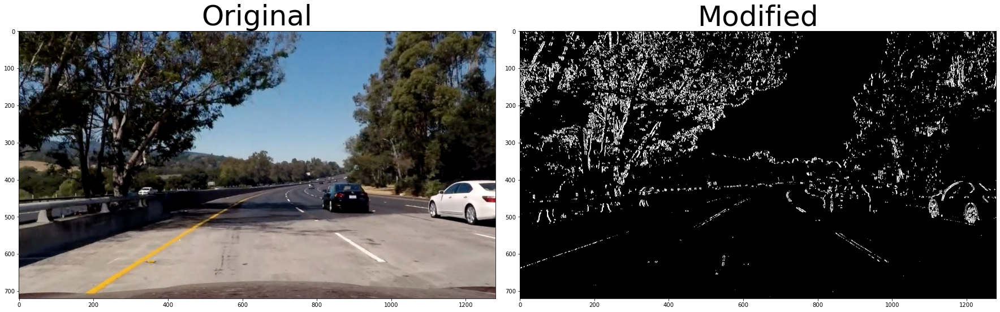

In [5]:
x_binary=binar.abs_sobel(gray, orient='x', sobel_kernel=3, thresh=(30, 120))
cal.compare_images(image, x_binary,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

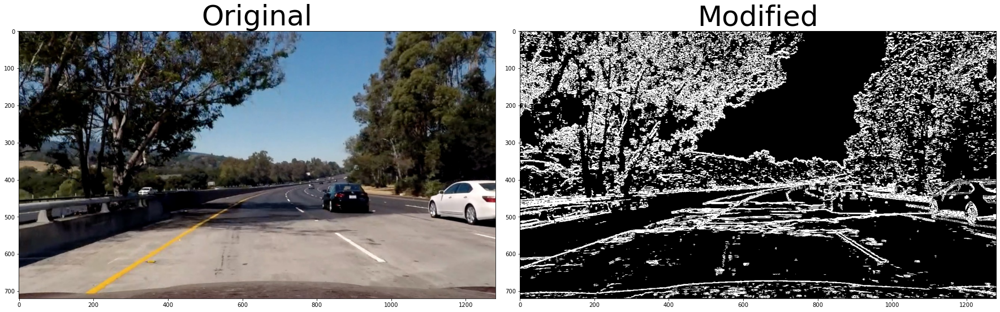

In [6]:
y_binary=binar.abs_sobel(gray, orient='y', sobel_kernel=3, thresh=(10, 120))
cal.compare_images(image, y_binary,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

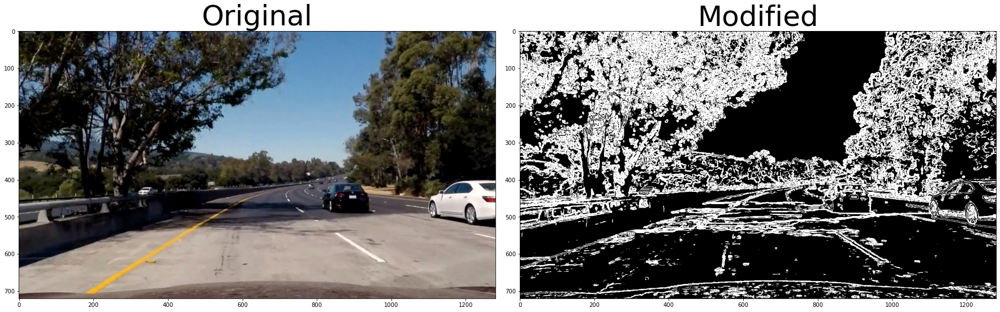

In [7]:
mag_binary= binar.mag_sobel(gray, sobel_kernel=3, thresh=(10, 80))
cal.compare_images(image, mag_binary,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

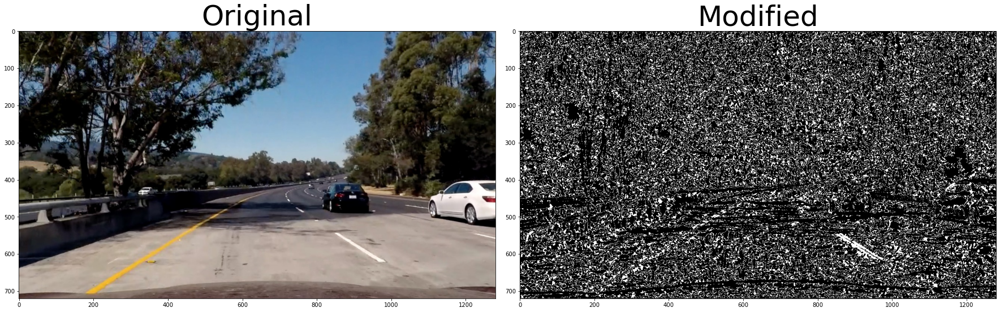

In [8]:
dir_binary= binar.dir_sobel(gray, sobel_kernel=9, thresh=(0.8, 1.2))
cal.compare_images(image, dir_binary,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

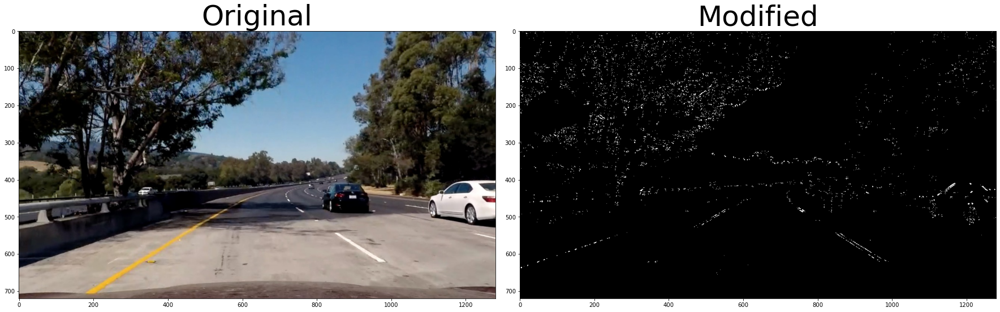

In [9]:
#Combined
combined = np.zeros_like(dir_binary)
combined[((x_binary == 1) & (dir_binary == 1))] = 1
cal.compare_images(image, combined,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

## Colorspaces

In [10]:
B_channel=image[:,:,0]
G_channel=image[:,:,1]
R_channel=image[:,:,2]

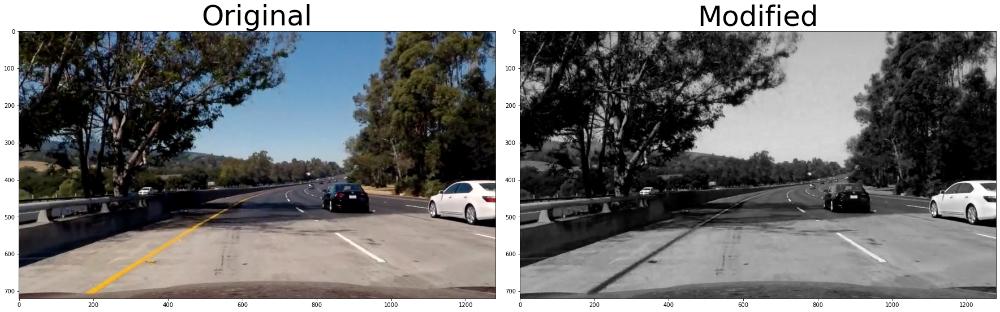

In [11]:
#See B_channel
cal.compare_images(image, B_channel,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

In [12]:
image_HLS = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
H_channel=image_HLS[:,:,0]
L_channel=image_HLS[:,:,1]
S_channel=image_HLS[:,:,2]

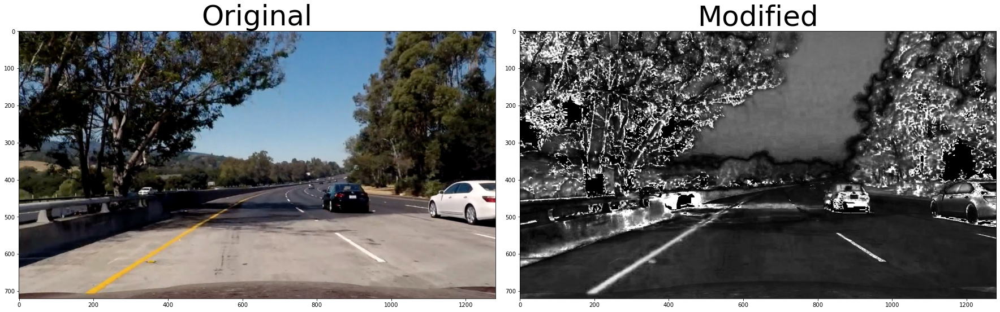

In [13]:
#See S_channel
cal.compare_images(image, S_channel,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

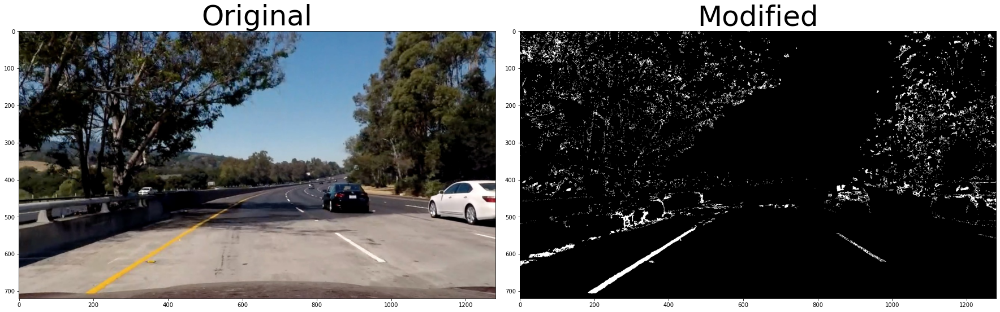

In [14]:
binary_S=binar.HLS_threshold(image, channel='S', thresh=(150, 250))
cal.compare_images(image, binary_S, save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

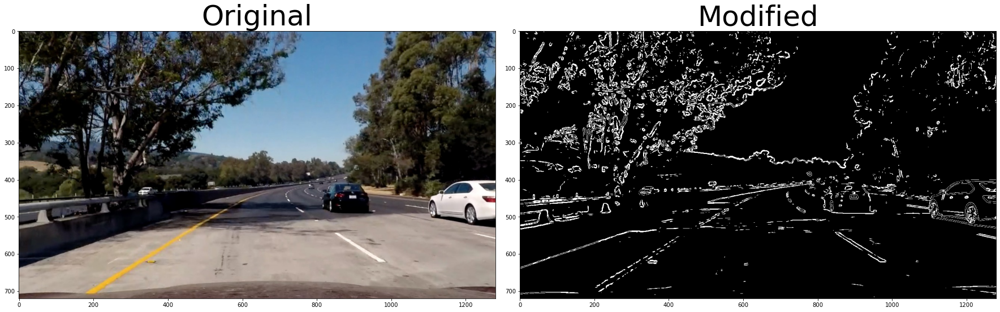

In [16]:
mag_binary_B=binar.mag_sobel(B_channel, sobel_kernel=7, thresh=(50, 100))
cal.compare_images(image, mag_binary_B, save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

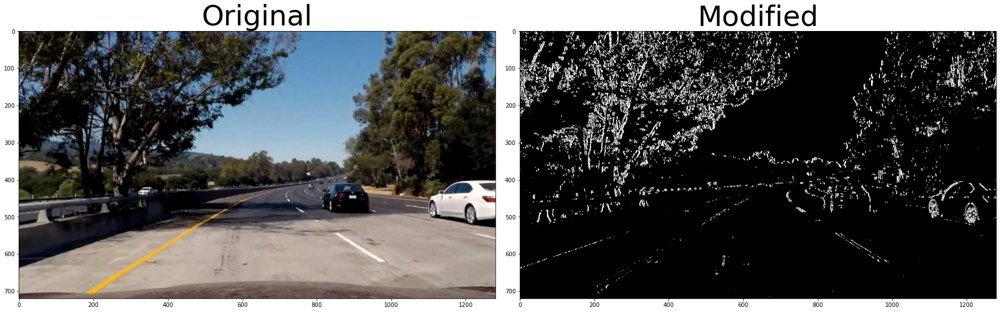

In [17]:
x_binary_B=binar.abs_sobel(B_channel, orient='x', sobel_kernel=3, thresh=(30, 120))
cal.compare_images(image, x_binary_B, save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

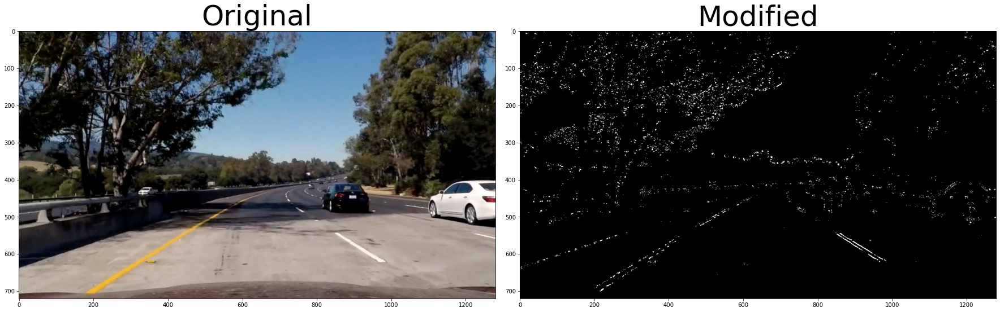

In [20]:
#Combined R
combined_B = np.zeros_like(dir_binary)
combined_B[((mag_binary_B == 1) & (dir_binary == 1))] = 1
cal.compare_images(image, combined_B,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

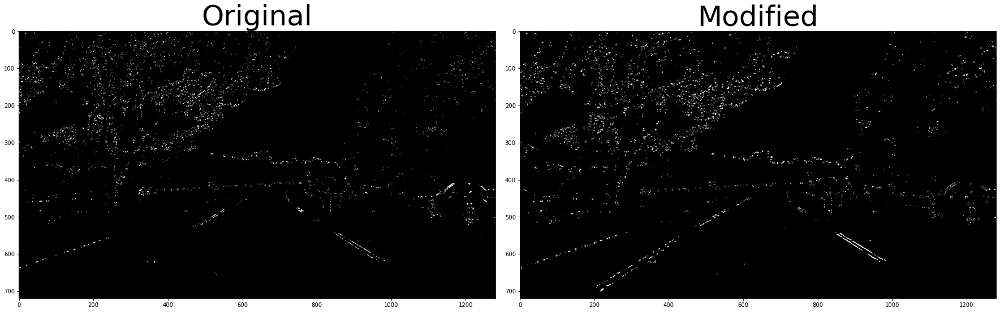

In [67]:
cal.compare_images(combined, combined_B,save=0, savefile=None, orig_format='GRAY', mod_format='GRAY')

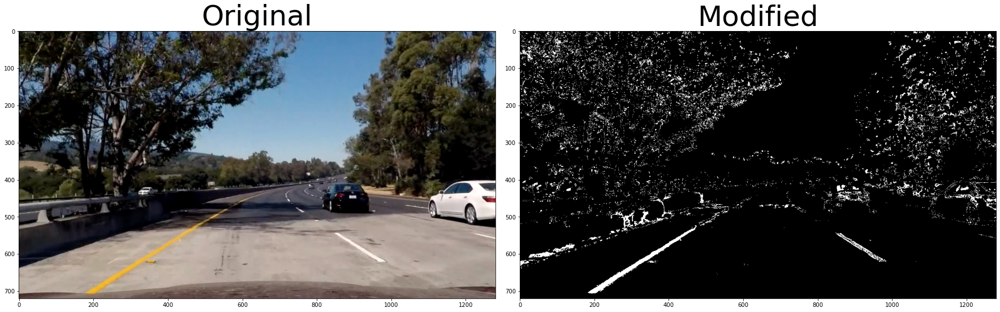

In [68]:
#Combined color
combined_color = np.zeros_like(dir_binary)
combined_color[(binary_S == 1) | ((x_binary_B == 1) & (dir_binary == 1))] = 1
cal.compare_images(image, combined_color,save=0, savefile=None, orig_format='BGR', mod_format='GRAY')

### Test pipeline

In [85]:
def binary_image(image):
    # Obatain binary image based on gradient in x of blue component
    B_channel=image[:,:,0]
    x_binary_B=binar.mag_sobel(B_channel, sobel_kernel=7, thresh=(50, 100))
    # Obtain binary image based on direction of gradient
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    dir_binary= binar.dir_sobel(gray, sobel_kernel=9, thresh=(0.8, 1.2))
    # Obtain binary image based on S channel
    binary_S=binar.HLS_threshold(image, channel='S', thresh=(150, 250))
    #Combine results
    combined = np.zeros_like(gray)
    combined[(binary_S == 1) | ((x_binary_B == 1) & (dir_binary == 1))] = 1
    return combined  

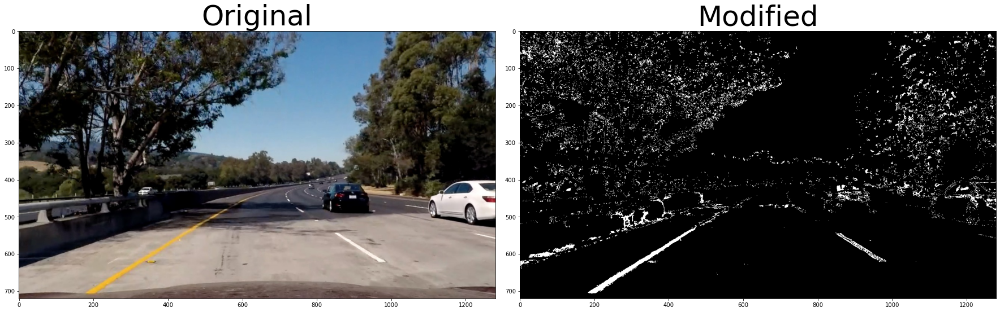

In [86]:
binary=binary_image(image)
cal.compare_images(image, binary, save=0, savefile=None, orig_format='BGR', mod_format='GRAY')